In [1]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import tensorflow as tf
%matplotlib inline

In [2]:
data_path="./Portraits/Portraits"
data=tf.keras.preprocessing.image_dataset_from_directory(data_path,label_mode=None,image_size=(64,64),batch_size=32)

Found 4117 files.


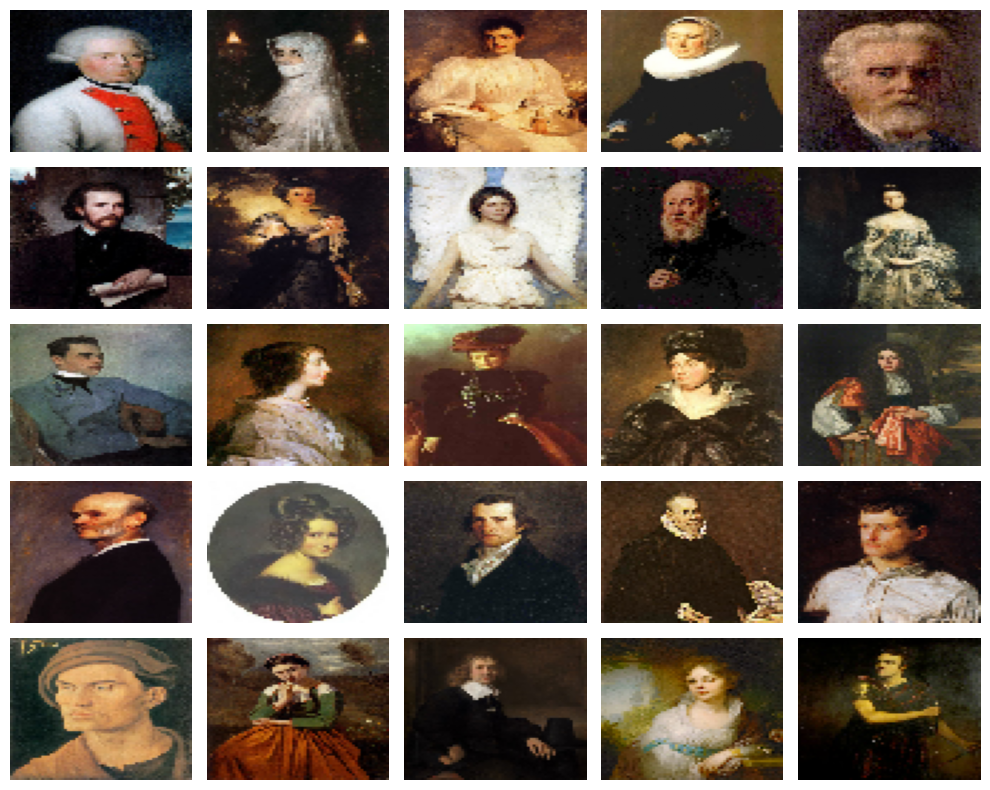

In [3]:
data = data.map(lambda x: x / 255.0)
images = next(iter(data.take(25)))

plt.figure(figsize=(10,8))
for i in range(25):
    plt.subplot(5,5, i + 1)
    plt.imshow(images[i].numpy())
    plt.axis("off")
    plt.gca().set_aspect('auto')

plt.tight_layout()
plt.show()

In [4]:
from keras.models import Sequential
from keras.layers import Dense, Reshape, UpSampling2D, Conv2D, BatchNormalization, Activation

latent_dim=110
g_resolution=2
generator=Sequential()
generator.add(Dense(4*4*256,activation="relu",input_dim=latent_dim))
generator.add(Reshape((4,4,256)))
generator.add(UpSampling2D())
generator.add(Conv2D(256,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(256,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(256,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(128,kernel_size=3,padding="same"))
generator.add(BatchNormalization(momentum=0.7))
generator.add(Activation("relu"))
generator.add(Conv2D(3,kernel_size=3,padding="same"))
generator.add(Activation("tanh"))
generator.summary()


c:\Users\VAIOPC\anaconda3\envs\art\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 4096)           │       454,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 3)      │         3,459 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 64, 64, 3)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,526,979 (9.64 MB)

 Trainable params: 2,525,187 (9.63 MB)

 Non-trainable params: 1,792 (7.00 KB)

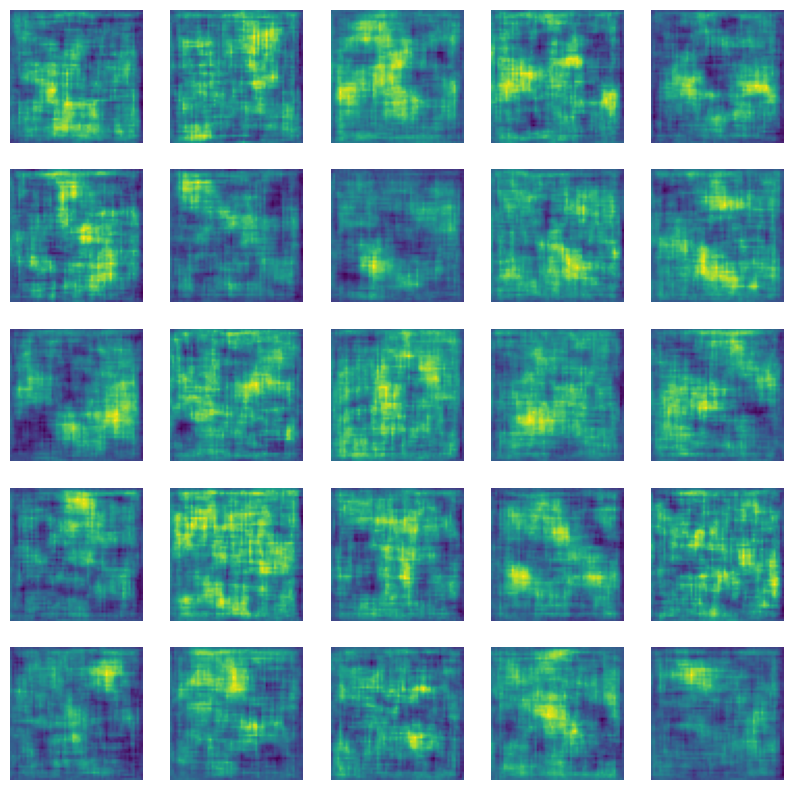

In [5]:

num_images = 25
random_vectors = tf.random.normal([num_images, latent_dim])
generated_images = generator(random_vectors, training=False)

plt.figure(figsize=(10, 10))
for i in range(num_images):
    plt.subplot(5, 5, i + 1)
    plt.imshow(generated_images[i, :, :, 0])
    plt.axis("off")
plt.show()


In [6]:
from keras.layers import Conv2D, LeakyReLU, Dropout, ZeroPadding2D, BatchNormalization, Flatten, Dense


discriminator = Sequential()
discriminator.add(Conv2D(32, kernel_size=3, strides=2, input_shape=(64,64,3), padding="same"))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
discriminator.add(ZeroPadding2D(padding=((0,1),(0,1))))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
discriminator.add(BatchNormalization(momentum=0.7))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation="sigmoid"))

discriminator.summary()

c:\Users\VAIOPC\anaconda3\envs\art\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\VAIOPC\anaconda3\envs\art\Lib\site-packages\keras\src\layers\activations\leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 17, 17, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 9, 9, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        41,473 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,613,889 (6.16 MB)

 Trainable params: 1,611,969 (6.15 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [7]:
result = discriminator(generated_images)
print (result)

tf.Tensor(
[[0.5000948 ]
 [0.50022507]
 [0.500162  ]
 [0.4999746 ]
 [0.50014114]
 [0.49997824]
 [0.5002257 ]
 [0.5000411 ]
 [0.5003203 ]
 [0.49981472]
 [0.49982902]
 [0.4997176 ]
 [0.49998295]
 [0.49964574]
 [0.5002307 ]
 [0.4999991 ]
 [0.49993825]
 [0.4997902 ]
 [0.5003871 ]
 [0.49965653]
 [0.49980104]
 [0.50044847]
 [0.5000158 ]
 [0.5001096 ]
 [0.50005776]], shape=(25, 1), dtype=float32)


In [ ]:
class GAN(tf.keras.Model):
    def __init__(self,discriminator,generator,latent_dim):
        
        
    
        super().__init__()
        self.discriminator=discriminator
        self.generator=generator
        self.latent_dim=latent_dim
        self.seed_generator=tf.keras.random.SeedGenerator(1440)
    
    
    def compile(self,d_optimizer,g_optimizer,loss_fun):
        super().compile()
        self.d_optimizer=d_optimizer
        self.g_optimizer=g_optimizer
        self.loss_fun=loss_fun
        self.d_loss_metric=tf.keras.metrics.Mean(name="d_loss")
        self.g_loss_metric=tf.keras.metrics.Mean(name="g_loss")
        
        
    @property
    
    def metrics(self):
        return [self.d_loss_metric,self.g_loss_metric]
    
    def train_step(self,real_image):
        batch_size=tf.shape(real_image)[0]
        random_vector=tf.random.normal(shape=(batch_size,self.latent_dim))
        
        generated_images=self.generator(random_vector)
        combined_images=tf.concat([generated_images,real_image],axis=0)
        labels=tf.concat([tf.ones((batch_size,1)),tf.zeros((batch_size,1))],axis=0)
        labels+=0.05*tf.random.uniform(tf.shape(labels))
        
        with tf.GradientTape() as tape:
            predictions=self.discriminator(combined_images)
            d_loss=self.loss_fun(labels,predictions)
        grads=tape.gradient(d_loss,self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(zip(grads,self.discriminator.trainable_weights))
        
        random_latent_vectors=tf.random.normal(shape=(batch_size,self.latent_dim))
        
        misleading_labels=tf.zeros((batch_size,1))
        
        
        with tf.GradientTape() as tape:
            predictions=self.discriminator(self.generator(random_latent_vectors))
            g_loss=self.loss_fun(misleading_labels,predictions)
        grads=tape.gradient(g_loss,self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads,self.generator.trainable_weights))
        
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}
    
    def load_model(self, checkpoint):
        self.model = 



In [19]:

class ImageGeneratorCallback(tf.keras.callbacks.Callback):
    def __init__(self, latent_dim):
        super(ImageGeneratorCallback, self).__init__()
        self.latent_dim = latent_dim
        self.generated_images = []

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(tf.random.normal(shape=(36, self.latent_dim)))
        self.generated_images.append(generated_images)
        if (epoch + 1) % 25 == 0 or (epoch + 1) == epochs:
            self.model.save_weights(f'checkpoints/epoch_{epoch}.weights.h5')
            fig, ax = plt.subplots(6, 6, figsize=(8, 8))
            for i in range(6):
                for j in range(6):
                    ax[i, j].imshow(generated_images[i * 6 + j])
                    ax[i, j].axis("off")
            plt.suptitle(f"Epoch {epoch + 1}/{epochs} - D Loss: {logs['d_loss']:.4f}, G Loss: {logs['g_loss']:.4f}")
            plt.show()

Epoch 1/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 157s 1s/step - d_loss: 0.6884 - g_loss: 1.1422
Epoch 2/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - d_loss: 0.6924 - g_loss: 0.8205
Epoch 3/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - d_loss: 0.6832 - g_loss: 0.7977
Epoch 4/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - d_loss: 0.6786 - g_loss: 0.8254
Epoch 5/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6859 - g_loss: 0.8101
Epoch 6/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6828 - g_loss: 0.8132
Epoch 7/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6815 - g_loss: 0.8147
Epoch 8/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6860 - g_loss: 0.8112
Epoch 9/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6803 - g_loss: 0.8135
Epoch 10/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6784 - g_loss: 0.8153
Epoch 11/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6817 - g_loss: 0.8188
Epoch 12/200
129/129 ━━━━━━━━━

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19658634..0.98377264].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.23051673..0.9847519].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.21920446..0.991656].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18668589..0.9999777].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.112305865..0.9986916].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16545783..0.96248066].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-

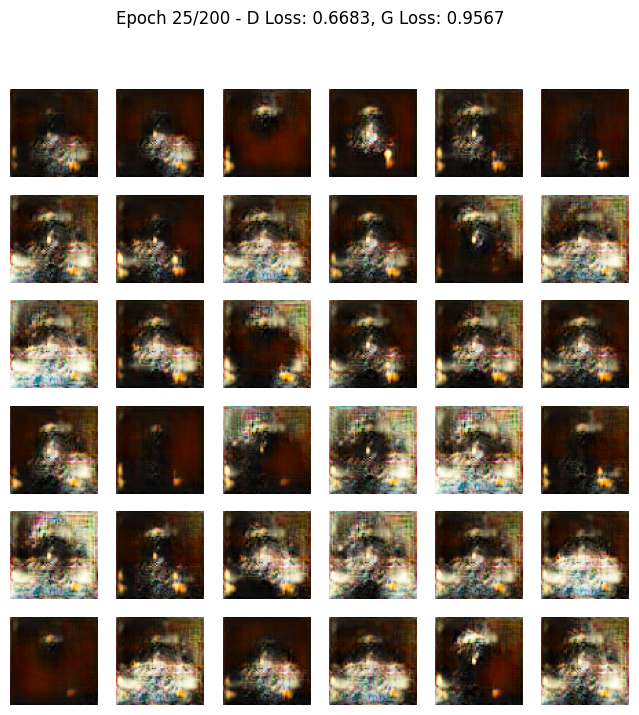

129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6880 - g_loss: 0.9512
Epoch 26/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6640 - g_loss: 0.9443
Epoch 27/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6826 - g_loss: 0.9153
Epoch 28/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6536 - g_loss: 0.9298
Epoch 29/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6620 - g_loss: 0.9882
Epoch 30/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6675 - g_loss: 0.9773
Epoch 31/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6448 - g_loss: 0.9980
Epoch 32/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6646 - g_loss: 0.9293
Epoch 33/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6644 - g_loss: 0.9135
Epoch 34/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6827 - g_loss: 0.8797
Epoch 35/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6779 - g_loss: 0.8885
Epoch 36/200
129/129 ━━━━━━━━━━━━━

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.31146142..0.9933577].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.52559525..0.9909929].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3214002..0.8926383].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16784829..0.9563754].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.41052407..0.9944589].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.43671048..0.95270187].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.

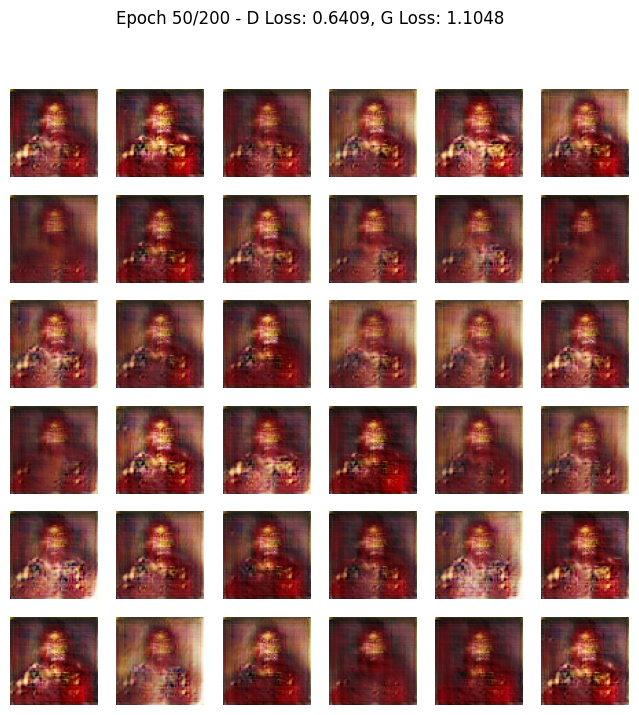

129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6335 - g_loss: 1.0810
Epoch 51/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6427 - g_loss: 1.1323
Epoch 52/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6461 - g_loss: 1.1443
Epoch 53/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6336 - g_loss: 1.0695
Epoch 54/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 154s 1s/step - d_loss: 0.6779 - g_loss: 1.0969
Epoch 55/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 160s 1s/step - d_loss: 0.6960 - g_loss: 0.9265
Epoch 56/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 159s 1s/step - d_loss: 0.6909 - g_loss: 0.9694
Epoch 57/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 156s 1s/step - d_loss: 0.6614 - g_loss: 1.0457
Epoch 58/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6580 - g_loss: 1.0083
Epoch 59/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6440 - g_loss: 1.0865
Epoch 60/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - d_loss: 0.6887 - g_loss: 1.0884
Epoch 61/200
129/129 ━━━━━━━━━━━━━

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19447844..0.9938223].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18725185..0.99962324].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2505681..0.99874693].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.042453382..0.9921358].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.41811216..0.9999584].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08531244..0.999561].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0

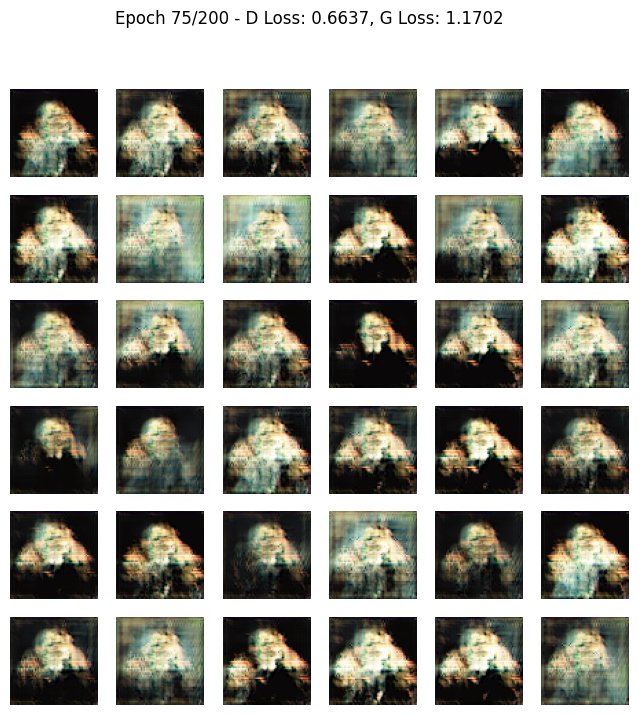

129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6700 - g_loss: 1.1197
Epoch 76/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6810 - g_loss: 1.0710
Epoch 77/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6633 - g_loss: 1.2318
Epoch 78/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - d_loss: 0.6431 - g_loss: 1.1262
Epoch 79/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - d_loss: 0.6718 - g_loss: 1.0125
Epoch 80/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6298 - g_loss: 1.1365
Epoch 81/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6336 - g_loss: 1.0988
Epoch 82/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6515 - g_loss: 1.0877
Epoch 83/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6508 - g_loss: 1.0708
Epoch 84/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - d_loss: 0.6268 - g_loss: 1.1604
Epoch 85/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - d_loss: 0.6353 - g_loss: 1.1019
Epoch 86/200
129/129 ━━━━━━━━━━━━━

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4993058..0.9957561].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.51299167..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17054936..0.9820524].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10404192..0.97401035].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16438073..0.99977386].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.29024035..0.9997104].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24397

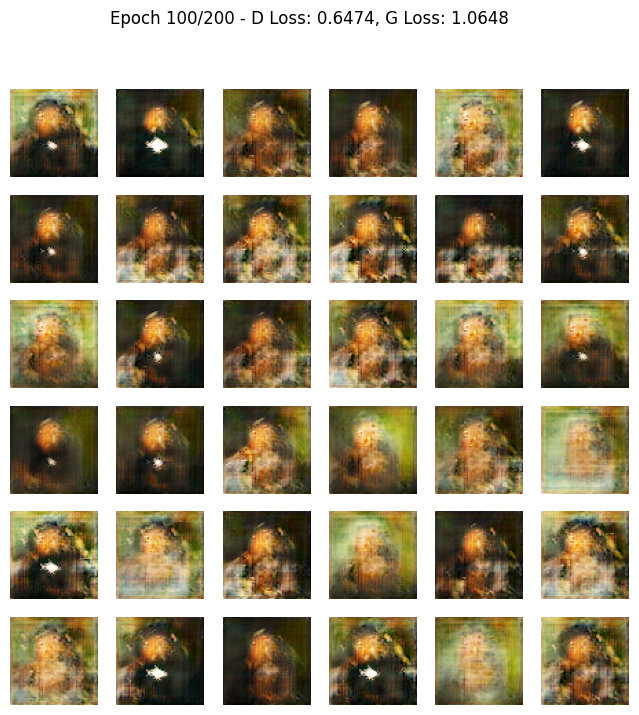

129/129 ━━━━━━━━━━━━━━━━━━━━ 180s 1s/step - d_loss: 0.6325 - g_loss: 1.0742
Epoch 101/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 186s 1s/step - d_loss: 0.6573 - g_loss: 1.1096
Epoch 102/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 168s 1s/step - d_loss: 0.6863 - g_loss: 1.0013
Epoch 103/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 155s 1s/step - d_loss: 0.6204 - g_loss: 1.1019
Epoch 104/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 161s 1s/step - d_loss: 0.6356 - g_loss: 1.1999
Epoch 105/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 164s 1s/step - d_loss: 0.6754 - g_loss: 0.9994
Epoch 106/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 162s 1s/step - d_loss: 0.6855 - g_loss: 1.0182
Epoch 107/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 176s 1s/step - d_loss: 0.6631 - g_loss: 1.0183
Epoch 108/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 172s 1s/step - d_loss: 0.6684 - g_loss: 1.1169
Epoch 109/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 168s 1s/step - d_loss: 0.6672 - g_loss: 1.0856
Epoch 110/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 159s 1s/step - d_loss: 0.6809 - g_loss: 0.9901
Epoch 111/200
129/129 ━━

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19212928..0.98919094].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.135362..0.9223027].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.27760646..0.97765994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1761..0.988557].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19601871..0.84411263].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30246952..0.9258055].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4802

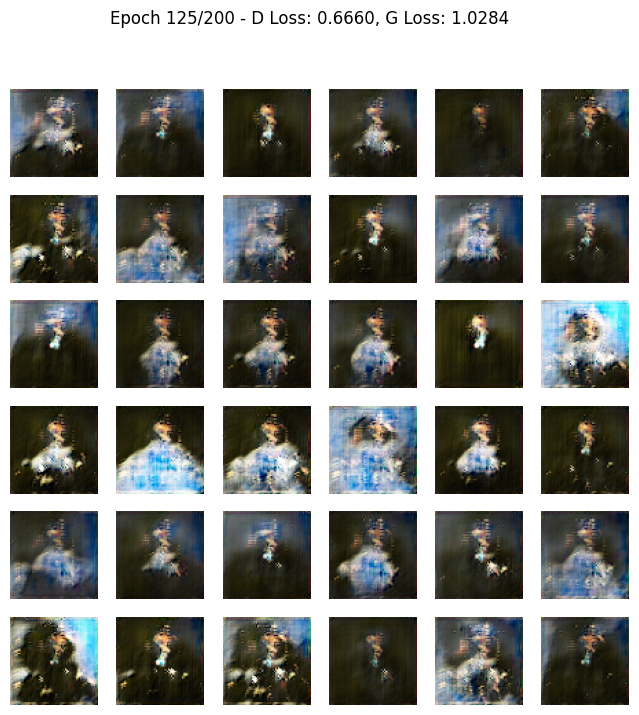

129/129 ━━━━━━━━━━━━━━━━━━━━ 181s 1s/step - d_loss: 0.6629 - g_loss: 0.9723
Epoch 126/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 176s 1s/step - d_loss: 0.6608 - g_loss: 0.9872
Epoch 127/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 165s 1s/step - d_loss: 0.6778 - g_loss: 0.9520
Epoch 128/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 164s 1s/step - d_loss: 0.6773 - g_loss: 0.9752
Epoch 129/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - d_loss: 0.6707 - g_loss: 0.9433
Epoch 130/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 164s 1s/step - d_loss: 0.6441 - g_loss: 1.0361
Epoch 131/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 177s 1s/step - d_loss: 0.6770 - g_loss: 0.9498
Epoch 132/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 174s 1s/step - d_loss: 0.6811 - g_loss: 1.1021
Epoch 133/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 177s 1s/step - d_loss: 0.6836 - g_loss: 0.9732
Epoch 134/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 197s 2s/step - d_loss: 0.6667 - g_loss: 0.9928
Epoch 135/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 196s 2s/step - d_loss: 0.6510 - g_loss: 1.0472
Epoch 136/200
129/129 ━━

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09409926..0.92171556].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20713797..0.9911957].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14008763..0.98209995].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12862149..0.97715914].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.37236542..0.9762442].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16304237..0.99332404].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range 

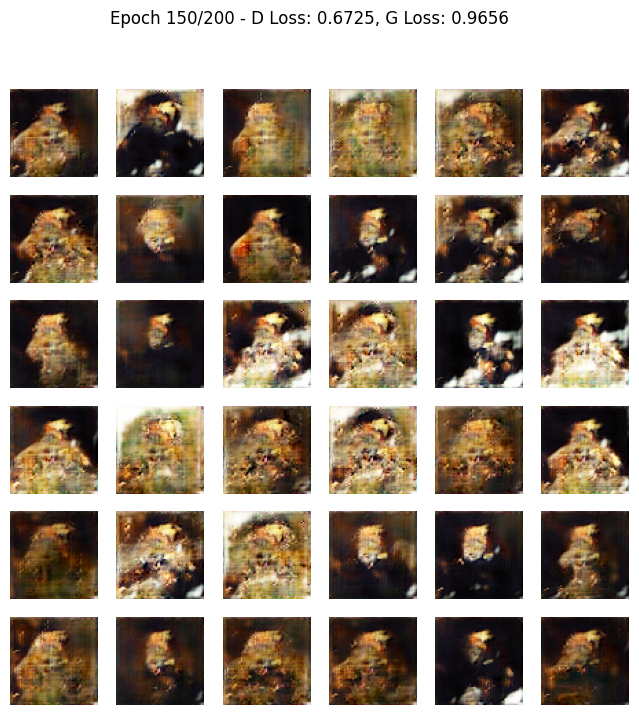

129/129 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - d_loss: 0.6764 - g_loss: 0.9639
Epoch 151/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - d_loss: 0.6862 - g_loss: 0.9039
Epoch 152/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - d_loss: 0.6707 - g_loss: 0.9242
Epoch 153/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - d_loss: 0.6696 - g_loss: 0.9469
Epoch 154/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - d_loss: 0.6755 - g_loss: 0.9383
Epoch 155/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - d_loss: 0.6784 - g_loss: 0.9733
Epoch 156/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - d_loss: 0.6732 - g_loss: 0.9427
Epoch 157/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - d_loss: 0.6724 - g_loss: 0.9564
Epoch 158/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - d_loss: 0.6840 - g_loss: 0.9142
Epoch 159/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - d_loss: 0.6765 - g_loss: 0.9806
Epoch 160/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - d_loss: 0.6767 - g_loss: 0.9205
Epoch 161/200
129/129 ━━

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.262003..0.9982515].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.31768513..0.92982554].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2646578..0.99328285].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1963091..0.99633324].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20040749..0.92126626].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.23815142..0.9924212].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.

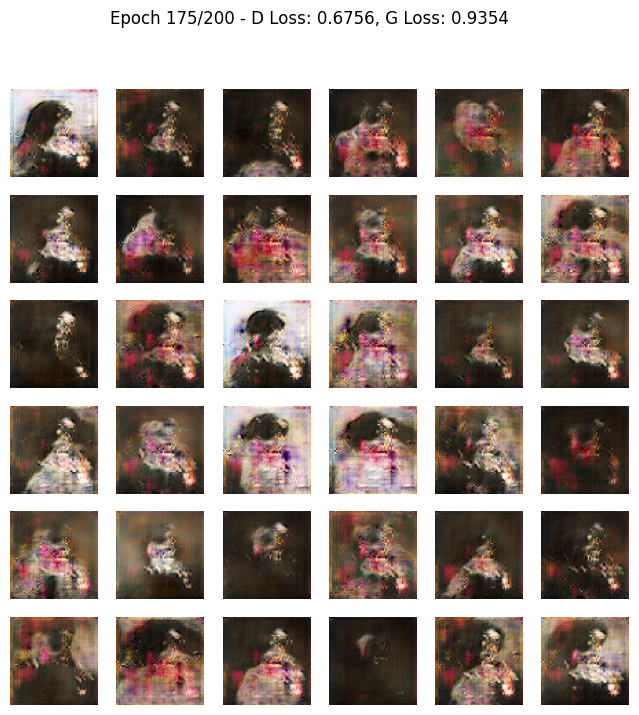

129/129 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - d_loss: 0.6764 - g_loss: 0.9041
Epoch 176/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - d_loss: 0.6670 - g_loss: 0.9223
Epoch 177/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - d_loss: 0.6834 - g_loss: 0.9291
Epoch 178/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - d_loss: 0.6559 - g_loss: 0.9477
Epoch 179/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - d_loss: 0.6701 - g_loss: 0.9654
Epoch 180/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 184s 1s/step - d_loss: 0.6786 - g_loss: 0.9728
Epoch 181/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 182s 1s/step - d_loss: 0.6754 - g_loss: 0.8964
Epoch 182/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 181s 1s/step - d_loss: 0.6679 - g_loss: 0.9198
Epoch 183/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 181s 1s/step - d_loss: 0.6677 - g_loss: 0.9367
Epoch 184/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 181s 1s/step - d_loss: 0.6729 - g_loss: 0.9583
Epoch 185/200
129/129 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - d_loss: 0.6687 - g_loss: 0.9103
Epoch 186/200
129/129 ━━

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.26360402..0.99887466].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.102525055..0.94181573].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22204769..0.98986953].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.27673608..0.9997807].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4287489..0.9999952].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14400467..0.9876273].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [

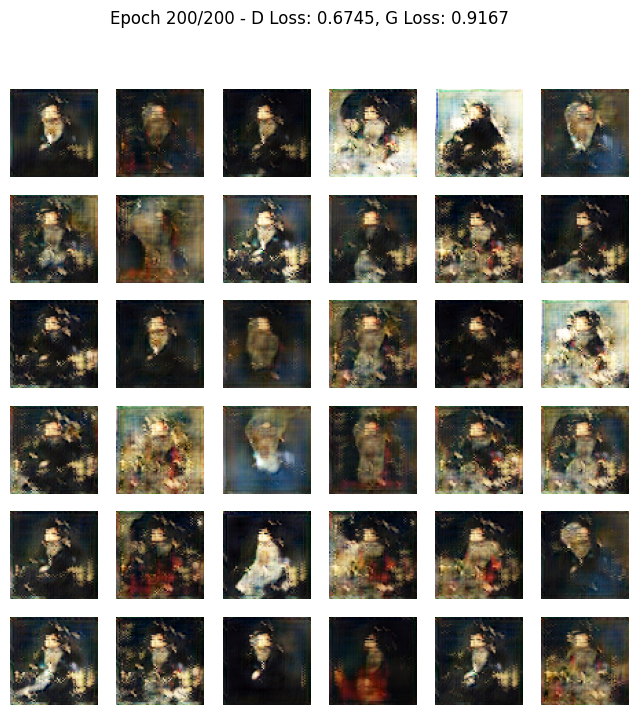

129/129 ━━━━━━━━━━━━━━━━━━━━ 182s 1s/step - d_loss: 0.6843 - g_loss: 0.9068


In [23]:
epochs = 200
batch_size = 64
d_learning_rate = 0.0001
g_learning_rate = 0.00014
decay_steps = 1000
decay_rate = 0.95
epsilon = 1e-07


d_learning_rate=tf.keras.optimizers.schedules.ExponentialDecay(d_learning_rate,decay_steps,decay_rate,
                                                              staircase=True)
g_learning_rate = tf.keras.optimizers.schedules.ExponentialDecay(g_learning_rate, decay_steps, decay_rate, 
                                                                 staircase=True)

model=GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# model.load_weights('checkpoints\epoch_3.weights.h5')
# model.load_weights('checkpoints\model_epoch_24.keras')

model.compile(d_optimizer=tf.keras.optimizers.RMSprop(learning_rate=d_learning_rate,epsilon=epsilon),
            g_optimizer=tf.keras.optimizers.RMSprop(learning_rate=g_learning_rate,epsilon=epsilon),
            loss_fun=tf.keras.losses.BinaryCrossentropy())
image_callback = ImageGeneratorCallback(latent_dim)
history = model.fit(data, epochs=epochs, batch_size=batch_size, callbacks=[image_callback])

In [24]:
import io
import os
import zipfile


zip_buffer = io.BytesIO()

with zipfile.ZipFile(zip_buffer, 'a', zipfile.ZIP_DEFLATED, False) as zip_file:
    for epoch, generated_images in enumerate(image_callback.generated_images, start=1):
        fig, axs = plt.subplots(6, 6, figsize=(10, 10))
        for i in range(6):
            for j in range(6):
                axs[i, j].imshow(generated_images[i * 6 + j])
                axs[i, j].axis('off')
        
        plt.suptitle(f"Epoch {epoch}/{epochs}")
        plt.savefig(f"epoch_{epoch}_images.png")
        plt.close(fig)
        
        zip_file.write(f"epoch_{epoch}_images.png", f"epoch_{epoch}_images.png")
        os.remove(f"epoch_{epoch}_images.png")

with open("generated_images.zip", "wb") as f:
    f.write(zip_buffer.getvalue())


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.43570265..0.9998095].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4789012..0.9994396].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5591163..0.9985679].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5210388..0.9998229].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48528576..0.99921286].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30820823..0.9983197].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.38

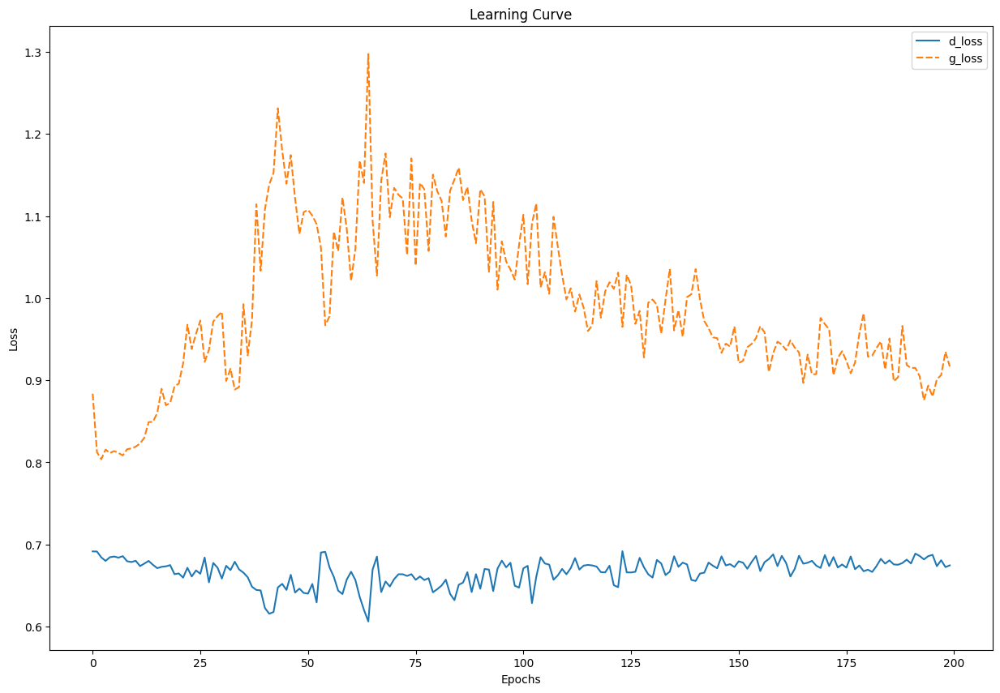

In [26]:
import seaborn as sns
fig = plt.figure(figsize=(15, 10))
ax = sns.lineplot(data=history.history)
ax.set(xlabel="Epochs")
ax.set(ylabel="Loss")
ax.set_title("Learning Curve")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2139799..0.9789712].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1975311..0.95233846].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2221233..0.99820775].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24444324..0.99451697].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19629185..0.9863812].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19503689..0.99432].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.21

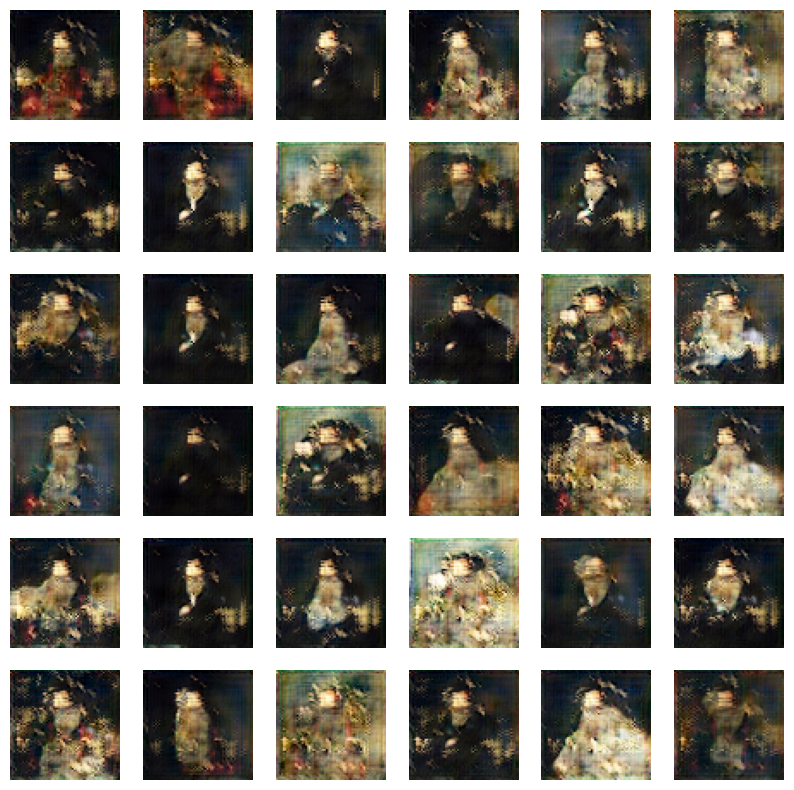

In [27]:
def generate_and_display_images(generator, num_images, latent_dim):
    generated_images = generator(tf.random.normal([num_images, latent_dim]), training=False)
    
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(num_images//6, num_images//6, i+1)
        plt.imshow(generated_images[i], cmap='gray', vmin=0, vmax=1)
        plt.axis('off')
    plt.show()

num_images = 36
generate_and_display_images(generator, num_images, latent_dim)


# Inception Score

In [1]:
from scipy.special import softmax
import numpy as np

def inception_score(predictions, num_splits=10):
    """
    Calculate the Inception Score (IS) for generated samples.
    Args:
        predictions (numpy.ndarray): Predictions from the Inception model (N x num_classes).
        num_splits (int): Number of splits for the calculation to improve stability.
    Returns:
        mean IS and standard deviation of IS across splits.
    """
    scores = []
    N = len(predictions)
    
    for i in range(num_splits):
        split = predictions[i * (N // num_splits):(i + 1) * (N // num_splits), :]
        p_y = np.mean(split, axis=0)  # Marginal probability
        scores.append(np.exp(np.mean(np.sum(split * (np.log(split + 1e-10) - np.log(p_y + 1e-10)), axis=1))))
    
    return np.mean(scores), np.std(scores)



# Frechet Inception Distance (FID)

In [2]:
from scipy.linalg import sqrtm
import numpy as np

def calculate_fid(mu1, sigma1, mu2, sigma2):
    """
    Calculate the Frechet Inception Distance (FID) between two distributions.
    Args:
        mu1 (numpy.ndarray): Mean vector of the first distribution (e.g., real data features).
        sigma1 (numpy.ndarray): Covariance matrix of the first distribution.
        mu2 (numpy.ndarray): Mean vector of the second distribution (e.g., generated data features).
        sigma2 (numpy.ndarray): Covariance matrix of the second distribution.
    Returns:
        fid (float): The Frechet Inception Distance.
    """
    diff = mu1 - mu2
    covmean = sqrtm(sigma1 @ sigma2)
    # Numerical error might result in imaginary components
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = diff @ diff + np.trace(sigma1 + sigma2 - 2 * covmean)
    return fid

# Enhanced discriminator

In [ ]:
# 1. Augmenting Training Data
from keras.preprocessing.image import ImageDataGenerator

data_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zoom_range=0.2,
)

augmented_data = data_gen.flow_from_directory('./Portraits/Portraits', target_size=(64, 64))

# 2. Enhanced Discriminator Architecture with Attention
from keras.layers import GlobalAveragePooling2D, Multiply, Add, Lambda

def add_attention_block(input_layer):
    # Channel Attention
    gap = GlobalAveragePooling2D()(input_layer)
    dense1 = Dense(128, activation="relu")(gap)
    dense2 = Dense(input_layer.shape[-1], activation="sigmoid")(dense1)
    channel_attention = Multiply()([input_layer, dense2])

    # Spatial Attention
    spatial_avg = Lambda(lambda x: tf.reduce_mean(x, axis=-1, keepdims=True))(input_layer)
    spatial_max = Lambda(lambda x: tf.reduce_max(x, axis=-1, keepdims=True))(input_layer)
    concat = tf.concat([spatial_avg, spatial_max], axis=-1)
    spatial_attention = Conv2D(1, kernel_size=7, activation="sigmoid", padding="same")(concat)

    return Add()([channel_attention, spatial_attention])

# Adding Attention to Discriminator
enhanced_discriminator = Sequential()
enhanced_discriminator.add(Conv2D(32, kernel_size=3, strides=2, input_shape=(64, 64, 3), padding="same"))
enhanced_discriminator.add(LeakyReLU(alpha=0.2))
enhanced_discriminator.add(Dropout(0.25))

# Adding attention after first block
enhanced_discriminator.add(add_attention_block(enhanced_discriminator.output))

# Add rest of the layers as in the original discriminator
# ...

# 3. Gradient Penalty Implementation for Stable Training
import tensorflow.keras.backend as K

def gradient_penalty_loss(real, fake, discriminator):
    """Calculates the gradient penalty."""
    alpha = tf.random.uniform([real.shape[0], 1, 1, 1], 0.0, 1.0)
    interpolates = alpha * real + (1 - alpha) * fake
    with tf.GradientTape() as tape:
        tape.watch(interpolates)
        pred = discriminator(interpolates)
    gradients = tape.gradient(pred, interpolates)
    gradients_norm = tf.sqrt(K.sum(K.square(gradients), axis=[1, 2, 3]))
    return K.mean((gradients_norm - 1.0) ** 2)

# Adding gradient penalty loss to the discriminator training
real_images = ... # real data batch
fake_images = generator(tf.random.normal([batch_size, latent_dim]))
gp_loss = gradient_penalty_loss(real_images, fake_images, discriminator)

# Update discriminator loss
d_loss = real_loss + fake_loss + gp_loss

# 4. Label Smoothing
real_labels = tf.ones((batch_size, 1)) * 0.9  # Smoothing real labels
fake_labels = tf.zeros((batch_size, 1))

# Use smoothed labels in the discriminator training step

# 5. Visualizing Performance
# Confusion matrix for fraud detection
from sklearn.metrics import confusion_matrix, classification_report

def evaluate_discriminator(discriminator, real_images, fake_images):
    y_true = [1] * len(real_images) + [0] * len(fake_images)
    predictions = discriminator.predict(tf.concat([real_images, fake_images], axis=0))
    y_pred = (predictions > 0.5).astype(int)
    print(confusion_matrix(y_true, y_pred))
    print(classification_report(y_true, y_pred))

# Call evaluate_discriminator during or after training
